# Project AI Aliens Galaxy 

of Alice Rossi, Tommaso Giannetti and Sara Vagheggini 



Our dataset is the ' Alien Galaxy' and it has different data on various alien species that are colonizing planets across the galaxy. Our work is to understand why certain planets are more attractive to these alien species , to promote a good coexistence between various species and optimize different alien species colonization strategies. Just from this description we understand that we are dealing with a _Clustering problem_.

We explore the data inside our csv by using different functions of pandas, just to have a look to how data are structured. 


In [1]:
# we start by importing all the libraries we need
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

## First Analysis and EDA

1) First of all we import our dataset and we start the analysis by printing 5 random rows. 
We do it to have a look to how data are structured and getting a general idea of the quantity of the data with the **shape** function. Then we use the **describe**  function to have some metrics to take into account; also the **info** function help us to identify the number of not null and other useful things.

In [2]:
aliens=pd.read_csv("alien_galaxy.csv")
aliens.sample(5, random_state=42) 

,Peace_Treaty_Accords,Technological_Advancements,Ammonia_Concentration,Precious_Metal_Trade_Tons,Food_Production_Tons,Trade_Agreements_Signed,Last_Contact_Days,Discovery_Date,Mineral_Extraction_Tons,Galactic_Visits,...,Alien_Population_Count,CO2_Concentration,Dominant_Species_Social_Structure,Hydrogen_Concentration,Colonization_Year,Species_Expansion_Response,Galactic_Trade_Revenue,Alien_Civilization_Level,Interstellar_Contact_Cost,Interplanetary_Communications
324,0.0,0.0,1.0,54.0,28.0,1.0,NaN,16-02-2029,282.0,1.0,...,67605.0,8.0,Together,46.41,3117.0,0.0,11.0,Graduation,3.0,2.0
96,0.0,0.0,1.0,5.0,5.0,2.0,24.0,27-04-2028,56.0,7.0,...,37509.0,4.0,Together,105.79,3106.0,0.0,NaN,Master,3.0,3.0
2104,0.0,0.0,0.0,79.0,22.0,1.0,NaN,06-05-2029,NaN,3.0,...,83917.0,10.0,Single,62.50,NaN,1.0,11.0,Graduation,3.0,6.0
1259,0.0,0.0,1.0,7.0,15.0,1.0,40.0,11-06-2029,15.0,4.0,...,42192.0,6.0,NaN,57.87,3078.0,0.0,11.0,NaN,3.0,2.0
1061,0.0,0.0,1.0,12.0,0.0,5.0,57.0,18-12-2028,217.0,6.0,...,60000.0,10.0,Single,39.76,3106.0,0.0,11.0,PhD,3.0,11.0


In [3]:
summary_stats=aliens.describe()
summary_stats.T

,count,mean,std,min,25%,50%,75%,max
Peace_Treaty_Accords,2005.0,0.067332,0.250658,0.00,0.00,0.00,0.00,1.00
Technological_Advancements,2028.0,0.066075,0.248474,0.00,0.00,0.00,0.00,1.00
Ammonia_Concentration,2023.0,1.478992,1.007601,0.00,1.00,1.00,2.00,5.00
Precious_Metal_Trade_Tons,2025.0,44.140741,52.559992,0.00,8.00,24.00,56.00,362.00
Food_Production_Tons,1994.0,26.177031,39.685028,0.00,1.00,8.00,33.00,199.00
Trade_Agreements_Signed,2033.0,2.310379,1.890865,0.00,1.00,2.00,3.00,15.00
Last_Contact_Days,2006.0,48.879362,29.013427,0.00,24.00,49.00,74.00,99.00
Mineral_Extraction_Tons,2032.0,164.693898,223.372040,0.00,16.00,67.00,226.50,1725.00
Galactic_Visits,2020.0,5.332178,2.432660,0.00,3.00,6.00,7.00,20.00
Sulfur_Concentration,2031.0,1.984244,1.414822,0.00,1.00,2.00,3.00,7.00


In [4]:
aliens.shape

(2240, 34)

In [5]:
aliens.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 34 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Peace_Treaty_Accords                 2005 non-null   float64
 1   Technological_Advancements           2028 non-null   float64
 2   Ammonia_Concentration                2023 non-null   float64
 3   Precious_Metal_Trade_Tons            2025 non-null   float64
 4   Food_Production_Tons                 1994 non-null   float64
 5   Trade_Agreements_Signed              2033 non-null   float64
 6   Last_Contact_Days                    2006 non-null   float64
 7   Discovery_Date                       2014 non-null   object 
 8   Mineral_Extraction_Tons              2032 non-null   float64
 9   Galactic_Visits                      2020 non-null   float64
 10  Sulfur_Concentration                 2031 non-null   float64
 11  Exploration_Missions          

In [6]:
print(aliens.dtypes) 

Peace_Treaty_Accords                   float64
Technological_Advancements             float64
Ammonia_Concentration                  float64
Precious_Metal_Trade_Tons              float64
Food_Production_Tons                   float64
Trade_Agreements_Signed                float64
Last_Contact_Days                      float64
Discovery_Date                          object
Mineral_Extraction_Tons                float64
Galactic_Visits                        float64
Sulfur_Concentration                   float64
Exploration_Missions                   float64
Biological_Research_Units              float64
Offspring_Colonies                     float64
Cultural_Exchange_Programs             float64
Military_Engagements                   float64
Inhabitants_Disputes                   float64
Resource_Mining_Operations             float64
Resource_Allocation_Credits            float64
Young_Colonies                         float64
HeavyMetals_Concentration              float64
Terraforming_

We immediately notice that our dataset is not too much big, it consists of just 2240 rows and 34 different columns. By printing the d.types it's clear the prevalence of the numerical data, overcoming the three 'object' columns: Dominant_Species_Social_Structure , Alien_Civilization_Level  and Discovery_Date. 

In [7]:
aliens[aliens.duplicated()] # just a quick check 

,Peace_Treaty_Accords,Technological_Advancements,Ammonia_Concentration,Precious_Metal_Trade_Tons,Food_Production_Tons,Trade_Agreements_Signed,Last_Contact_Days,Discovery_Date,Mineral_Extraction_Tons,Galactic_Visits,...,Alien_Population_Count,CO2_Concentration,Dominant_Species_Social_Structure,Hydrogen_Concentration,Colonization_Year,Species_Expansion_Response,Galactic_Trade_Revenue,Alien_Civilization_Level,Interstellar_Contact_Cost,Interplanetary_Communications


## Identifying missing values

Firstly we want to see the percentage of the missing values over the total  values per each column. We are checking if the percentage of the null values is relevant to understand if it is better to remove the column itself or to substitute the null values with a method like the mode, the mean or the knn imputer .

We decided to consider relevant a percentage greater than the 5 %, so we can't drop the null values if they constitute more than the 5% . 

In [8]:
def missing_values_table(aliens):
        # Total missing values
        mis_val = aliens.isnull().sum()

        # Percentage of missing values
        mis_val_percent = 100 * aliens.isnull().sum() / len(aliens)

        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)

        # Print some summary information
        print ("This aliens_encodedframe has " + str(aliens.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")

        # Return the aliens_encodedframe with missing information
        return mis_val_table_ren_columns


missing_values_table(aliens)

This aliens_encodedframe has 34 columns.
There are 34 columns that have missing values.


,Missing Values,% of Total Values
Colonization_Year,260,11.6
Galactic_Trade_Revenue,257,11.5
Liquid_Energy_Consumption_Terawatts,248,11.1
Food_Production_Tons,246,11.0
Alien_Population_Count,241,10.8
Offspring_Colonies,238,10.6
Peace_Treaty_Accords,235,10.5
Last_Contact_Days,234,10.4
Dominant_Species_Social_Structure,233,10.4
Hydrogen_Concentration,231,10.3


<Figure size 600x300 with 0 Axes>

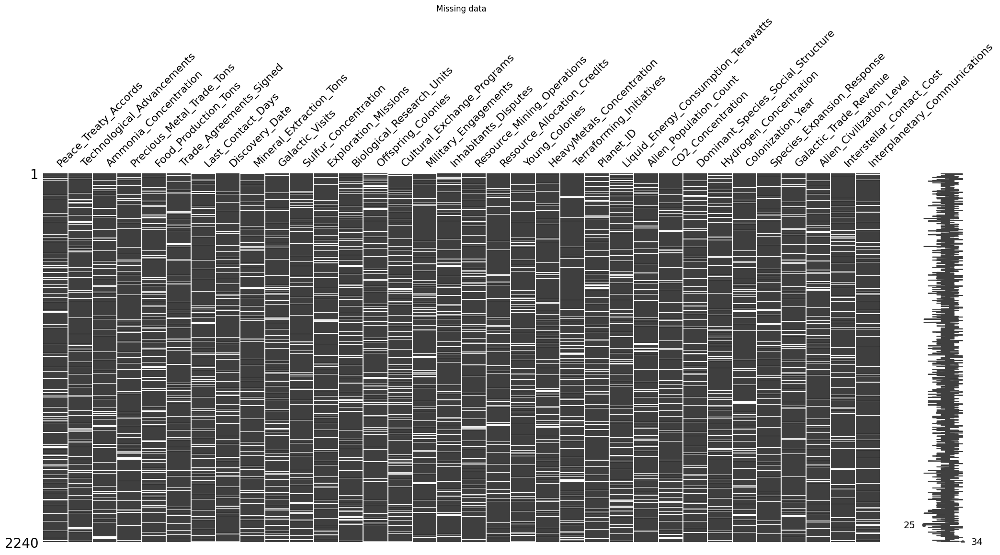

In [9]:
plt.figure(figsize=(6,3))
msno.matrix(aliens)
plt.title('Missing data')
plt.show()

# Plotting our variables 

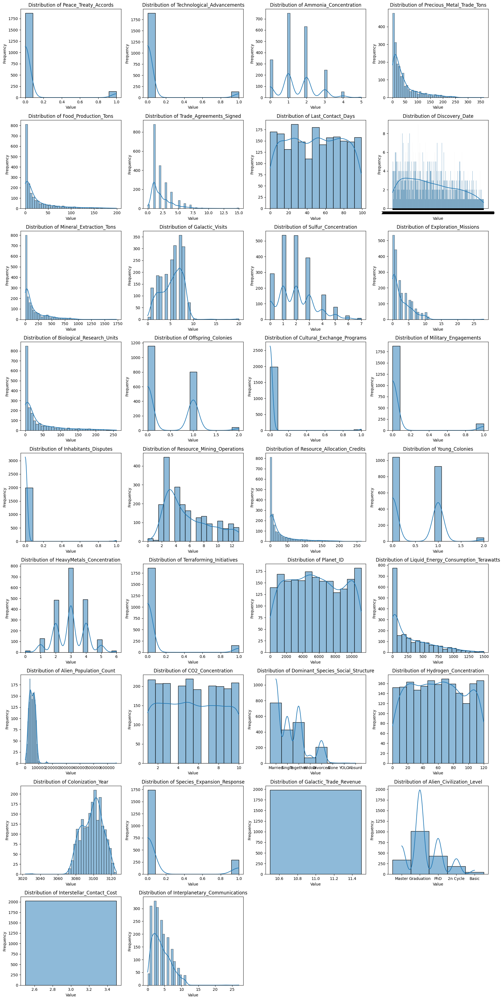

In [10]:
num_cols = len(aliens.columns)
cols_per_row = 4
rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axs = plt.subplots(rows, cols_per_row, figsize=(18, rows * 4))
axs = axs.flatten()

# Histogram 
for i, col in enumerate(aliens.columns):
    sns.histplot(aliens[col], kde=True, ax=axs[i])
    axs[i].set_title(f'Distribution of {col}')
    axs[i].set_xlabel('Value')
    axs[i].set_ylabel('Frequency')

for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

### Analysis of Feature Distributions  

The visualizations above represent the distributions of various features within the dataset. These insights help in understanding the main characteristics of the data:

- **Skewed Distributions**:  
  - Many variables, such as **Food_Production_Tons** and **Liquid_Energy_Consumption_Terawatts**, display **right-skewed distributions**.  

- **Uniform Distributions**:  
  - Features like **CO2_Concentration** appear uniformly distributed, with _no prominent_ trends.  

- **Presence of Outliers**:  
  - Variables such as **Mineral_Extraction_Tons** show *extreme values* that deviate significantly from the main cluster of data points.  

- **Categorical Features**:  
  - We identified two categorical features: **Alien_Civilization_Level** and **Dominant_Species_Social_Structure**.  

- **Variables with Constant Values**:  
  - Two variables, **Interstellar_Contact_Cost** and **Galactic_Trade_Revenues**, display completely colored graphs, indicating constant values.  

- **Unusual Data Variable**:  
  - The variable **Discovery_Date** appears unusual in its plotting, likely because it contains non-numeric data. This variable may need conversion.  

---

### Decision to Drop Certain Columns  

Based on the above analysis, we decided to drop some columns that, in our opinion, do not contribute to our final goal:  

- **Dropped Columns**:  
  - **Interstellar_Contact_Cost** and **Galactic_Trade_Revenues**: These had constant values and provided no useful information.  
  - **Inhabitants_Disputes**, **Cultural_Exchange_Programs**, and **Discovery_Date**: These variables were removed as their data, shown in the graphs, did not add value to our analysis.  


In [11]:
columns_to_drop = ['Discovery_Date', 'Interstellar_Contact_Cost','Galactic_Trade_Revenue', 'Inhabitants_Disputes', 'Cultural_Exchange_Programs']  
aliens.drop(columns=columns_to_drop, inplace=True)

# Handling the categorical variables

We only have 2 categorical variables, so we decided to make them numerical encoding them. 

We used an ordered mapping for the Alien Civilization Level because we could find an increasing order in the different level of education, associating the 'Basic' level to '0' , and the 'PhD' to '4'. 
For the Dominant Species Social Structure we identified the unique values and we didn't find any logical order, so we decide not to manually map them (as we do with the other categorical variable), but we used the One Hot Encoding method. We also ensured that the value 'nan' was a column with 0 and 1 . 



In [12]:
unique_values = aliens['Dominant_Species_Social_Structure'].unique()
print("Unique values in the column 'Dominant_Species_Social_Structure':")
print(unique_values)

Unique values in the column 'Dominant_Species_Social_Structure':
['Married' 'Single' 'Together' 'Widow' nan 'Divorced' 'Alone' 'YOLO'
 'Absurd']


In [13]:

# Define ordered mapping for 'Alien_Civilization_Level'
civilization_mapping = {
    "Basic": 0,
    "2n Cycle": 1,
    "Graduation": 2,
    "Master": 3,
    "PhD": 4
}

# Apply mappings to encode categorical variables
aliens['Alien_Civilization_Level'] = aliens['Alien_Civilization_Level'].map(civilization_mapping)

# Display the first few rows to verify the mappings
print(aliens[['Alien_Civilization_Level']].head())


   Alien_Civilization_Level
0                       3.0
1                       3.0
2                       2.0
3                       3.0
4                       2.0


In [14]:

aliens['Structure_Nothing'] = aliens['Dominant_Species_Social_Structure'].isnull().astype(int)

# applying one hot encoding
aliens = pd.get_dummies(aliens, columns=['Dominant_Species_Social_Structure'], prefix="Structure")




# Detecting Outliers

### Outlier Removal Using the Interquartile Range (IQR) Method  

We used the **Interquartile Range (IQR) method** to identify and remove outliers from the dataset. This method defines outliers as values that fall significantly outside the normal range of the data.  

- We set a **high threshold of 4 times IQR** for outliers because only the most extreme cases should be marked as such.  
  - A lower threshold would have removed too many values, including potentially meaningful data.  

- Columns with only two unique values, like **binary variables**, were excluded since outliers make no sense in that context.  

- **Rows containing outliers** were removed:  
  - Outliers were excluded because they can distort the statistical measures used in our analysis.  
  - After deletion, outliers represented about **4% of all values**, which we determined was not a significant percentage.  

We also attempted to **impute the outliers** with the mean or median. However, this approach proved unsuitable as it still skewed the data distribution.  


In [15]:
def detect_outliers_iqr(aliens, columns):
    outlier_indices = {}
    for col in columns:
        Q1 = aliens[col].quantile(0.25)  
        Q3 = aliens[col].quantile(0.75)  
        IQR = Q3 - Q1                    
        lower_bound = Q1 - 4 * IQR       
        upper_bound = Q3 + 4 * IQR       
        outliers = aliens[(aliens[col] < lower_bound) | (aliens[col] > upper_bound)]
        outlier_indices[col] = outliers.index.tolist()
    return outlier_indices

# identify the numerical columns
numerical_columns = aliens.select_dtypes(include=['float64', 'int64']).columns

# excluding the binary columns
columns_no_binary = [col for col in numerical_columns if aliens[col].nunique() > 2]


outliers = detect_outliers_iqr(aliens, columns_no_binary)
for col, indices in outliers.items():
    print(f"Column: {col}, Outliers: {len(indices)}")






Column: Ammonia_Concentration, Outliers: 0
Column: Precious_Metal_Trade_Tons, Outliers: 4
Column: Food_Production_Tons, Outliers: 32
Column: Trade_Agreements_Signed, Outliers: 10
Column: Last_Contact_Days, Outliers: 0
Column: Mineral_Extraction_Tons, Outliers: 5
Column: Galactic_Visits, Outliers: 0
Column: Sulfur_Concentration, Outliers: 0
Column: Exploration_Missions, Outliers: 4
Column: Biological_Research_Units, Outliers: 13
Column: Offspring_Colonies, Outliers: 0
Column: Resource_Mining_Operations, Outliers: 0
Column: Resource_Allocation_Credits, Outliers: 46
Column: Young_Colonies, Outliers: 0
Column: HeavyMetals_Concentration, Outliers: 0
Column: Planet_ID, Outliers: 0
Column: Liquid_Energy_Consumption_Terawatts, Outliers: 0
Column: Alien_Population_Count, Outliers: 1
Column: CO2_Concentration, Outliers: 0
Column: Hydrogen_Concentration, Outliers: 0
Column: Colonization_Year, Outliers: 0
Column: Alien_Civilization_Level, Outliers: 0
Column: Interplanetary_Communications, Outliers

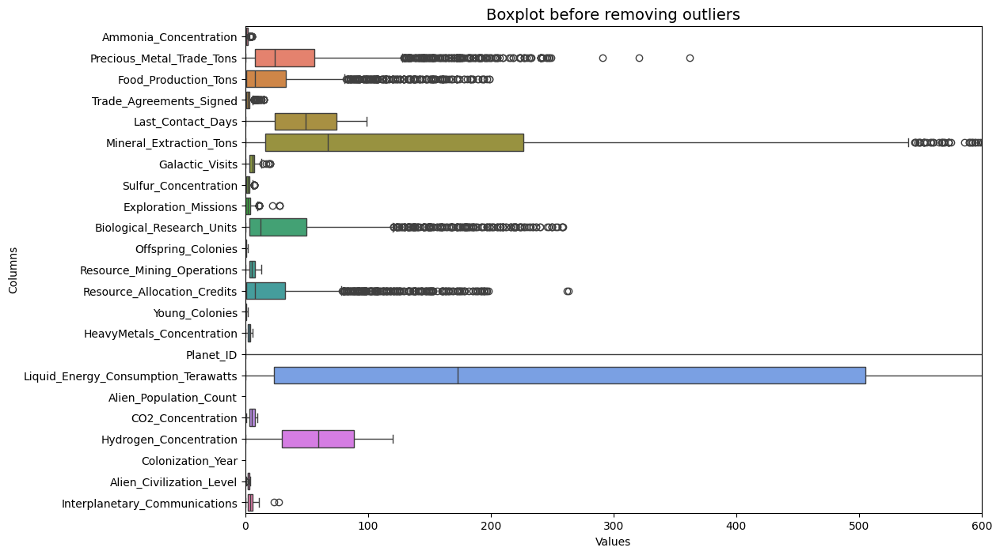

In [16]:

plt.figure(figsize=(12, 8))

plt.title("Boxplot before removing outliers", fontsize=14)


plt.xlabel("Values")
plt.ylabel("Columns")
plt.xlim(0,600 )

sns.boxplot(data=aliens[columns_no_binary], orient='h')
plt.show()

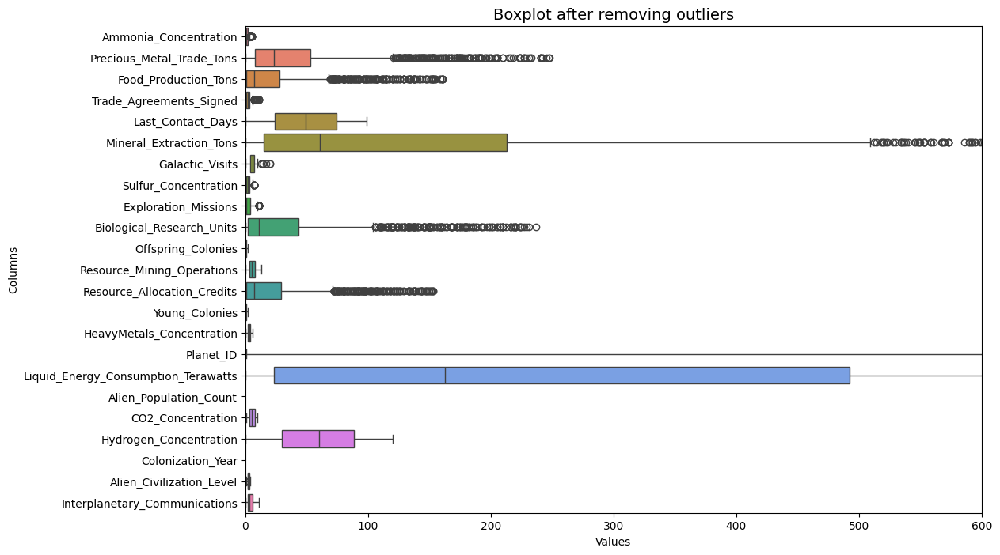

In [17]:

# Removing the outliers
for col, indices in outliers.items():
    aliens.drop(index=indices, inplace=True, errors='ignore')

plt.figure(figsize=(12, 8))


plt.title("Boxplot after removing outliers", fontsize=14)

plt.xlabel("Values")
plt.ylabel("Columns")
plt.xlim(0,600)


sns.boxplot(data=aliens[columns_no_binary], orient='h')
plt.show()


In [18]:

remaining_outliers = detect_outliers_iqr(aliens, columns_no_binary)

total_remaining_outliers = 0
for col, indices in remaining_outliers.items():
    print(f"Colonna: {col}, Outliers rimasti: {len(indices)}")
    total_remaining_outliers += len(indices)

print(f"Totale outliers rimasti: {total_remaining_outliers}")

#97 represents the 5 percent od the dataset, it is acceptable 


Colonna: Ammonia_Concentration, Outliers rimasti: 0
Colonna: Precious_Metal_Trade_Tons, Outliers rimasti: 9
Colonna: Food_Production_Tons, Outliers rimasti: 38
Colonna: Trade_Agreements_Signed, Outliers rimasti: 0
Colonna: Last_Contact_Days, Outliers rimasti: 0
Colonna: Mineral_Extraction_Tons, Outliers rimasti: 0
Colonna: Galactic_Visits, Outliers rimasti: 2
Colonna: Sulfur_Concentration, Outliers rimasti: 0
Colonna: Exploration_Missions, Outliers rimasti: 0
Colonna: Biological_Research_Units, Outliers rimasti: 26
Colonna: Offspring_Colonies, Outliers rimasti: 0
Colonna: Resource_Mining_Operations, Outliers rimasti: 0
Colonna: Resource_Allocation_Credits, Outliers rimasti: 22
Colonna: Young_Colonies, Outliers rimasti: 0
Colonna: HeavyMetals_Concentration, Outliers rimasti: 0
Colonna: Planet_ID, Outliers rimasti: 0
Colonna: Liquid_Energy_Consumption_Terawatts, Outliers rimasti: 0
Colonna: Alien_Population_Count, Outliers rimasti: 0
Colonna: CO2_Concentration, Outliers rimasti: 0
Colonn

In [19]:
print(aliens.shape)

(2140, 37)


# Scale the variables
We start by scaling our variables using the StandardScaler. 
We chose StandardScaler since it was the best fit for our dataset. It standardizes features by centering them at 0 and scaling them to a unit variance, ensuring that all features contribute in the same way, regardless of their initial distribution. This is particularly significant for distance-based clustering approaches such as K-Means and Agglomerative Clustering.
StandardScaler further improves the KNN Imputer, which we used to fill missing values, by guaranteeing that neighbor distances are meaningful and not dominated by higher magnitude features.

StandardScaler effectively preserves the variability and correlations between features after removing extreme outliers. In contrast, MinMaxScaler amplified the influence of outliers, whereas RobustScaler, despite being robust to outliers, failed to conserve variability for features with normal distribution.

## Filling Missing Values
Then we chose the KNN Imputer to handle missing values because it provided the best results compared to other methods.

We first tried mean, median, and mode imputation, but each had substantial problems. 
 - Mean imputation altered data distribution, particularly for skewed variables or outliers. 
 - Median imputation was more robust, but it didn't capture feature correlations, resulting in inconsistency. 
 - Mode imputation, while effective for categorical variables, resulted in spurious clusters and was unsuitable for continuous data.

KNN Imputer stood out for preserving features' relationships by imputing values based on similar data points (nearest neighbors). This strategy preserved the natural variance while avoiding the biases induced by simpler methods. To increase its effectiveness, we scaled the data before imputation to ensure that the distances between neighbors were significant.

The result of this and of fit_transform is a new DataFrame, aliens_imputed. 
After the imputation, the data is rescaled to ensure that the imputed values fit within the original scaled range.


In [20]:
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler


# Identify all columns for scaling (including the mapped categorical columns)
scaler = StandardScaler()
aliens = pd.DataFrame(scaler.fit_transform(aliens), columns=aliens.columns)

# Apply KNN Imputer to handle missing values
knn_imputer = KNNImputer(n_neighbors=5)
aliens_imputed = pd.DataFrame(knn_imputer.fit_transform(aliens), columns=aliens.columns)
#Re scale data again 
scaler = StandardScaler()
aliens_imputed = pd.DataFrame(scaler.fit_transform(aliens_imputed), columns=aliens_imputed.columns)


# Display the first few rows of the scaled and imputed dataset
print(aliens_imputed.head())


   Peace_Treaty_Accords  Technological_Advancements  Ammonia_Concentration  \
0             -0.281993                   -0.252717              -0.495584   
1             -0.281993                   -0.252717               0.537889   
2             -0.281993                   -0.252717              -0.495584   
3             -0.281993                   -0.252717              -0.495584   
4             -0.281993                   -0.252717              -1.529056   

   Precious_Metal_Trade_Tons  Food_Production_Tons  Trade_Agreements_Signed  \
0                  -0.027366              2.572396                -0.780706   
1                   1.385500              0.806257                -0.780706   
2                   2.486705              0.928060                 0.063087   
3                   1.364723             -0.472671                 0.424713   
4                  -0.255918              1.110764                 2.835552   

   Last_Contact_Days  Mineral_Extraction_Tons  Galactic_

In this other part of the code, we want to check the statistical properties of the dataset after the imputation. We compute the mean and the standard deviation of each column in the scaled dataset to validate that the dataset is correctly scaled and imputed at each step. 


In [21]:
# verifying the scaling after imputation


print("\nStatistics after KNN Imputation and Re-Scaling:")
print("Mean:\n", aliens_imputed.mean())
print("Standard Deviation:\n", aliens_imputed.std())

for col in aliens_imputed.columns:
    mean = aliens_imputed[col].mean()
    std = aliens_imputed[col].std()
    print(f"Column: {col}, Mean: {mean:.5f}, Std: {std:.5f}")



Statistics after KNN Imputation and Re-Scaling:
Mean:
 Peace_Treaty_Accords                  -4.980440e-18
Technological_Advancements             2.158191e-17
Ammonia_Concentration                 -1.494132e-17
Precious_Metal_Trade_Tons              1.660147e-18
Food_Production_Tons                  -7.470660e-18
Trade_Agreements_Signed                1.660147e-18
Last_Contact_Days                      1.079095e-17
Mineral_Extraction_Tons                3.403300e-17
Galactic_Visits                       -3.735330e-18
Sulfur_Concentration                   3.901344e-17
Exploration_Missions                  -1.826161e-17
Biological_Research_Units              6.640586e-18
Offspring_Colonies                     4.316381e-17
Military_Engagements                   1.162103e-17
Resource_Mining_Operations            -5.478484e-17
Resource_Allocation_Credits            3.735330e-17
Young_Colonies                        -3.237286e-17
HeavyMetals_Concentration              3.320293e-17
Terrafor

Now we create a grid of subplots to visualize the distribution of each feature in the dataset in an organized way. Even from this graph we can get an idea of the features we are gonna drop in the next steps (in the correlation matrix), because some graphs shows focus on mostly one value, and this information it's not important for us. 



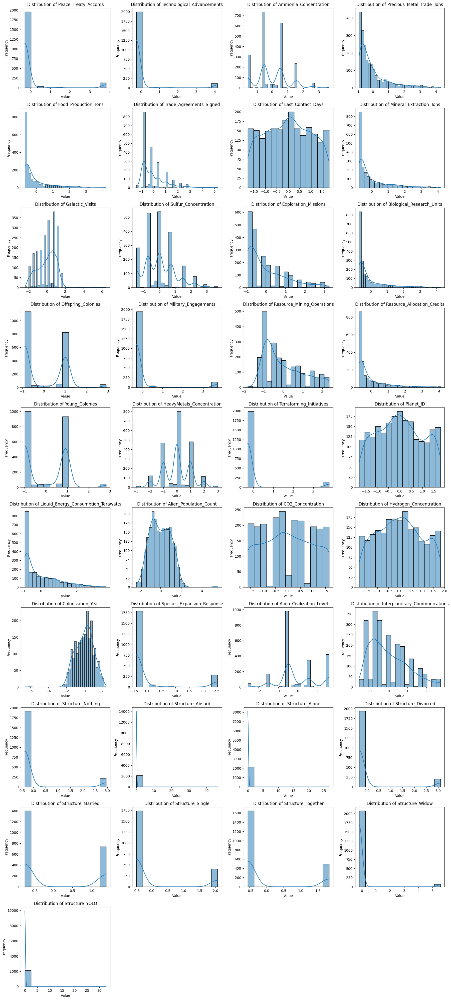

In [22]:
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer



num_cols = len(aliens_imputed.columns)
cols_per_row = 4
rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axs = plt.subplots(rows, cols_per_row, figsize=(18, rows * 4))
axs = axs.flatten()


for i, col in enumerate(aliens_imputed.columns):
    sns.histplot(aliens_imputed[col], kde=True, ax=axs[i])
    axs[i].set_title(f'Distribution of {col}')
    axs[i].set_xlabel('Value')
    axs[i].set_ylabel('Frequency')


for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


We now plot the matrix that shows how our missing data has been successfully imputed as there are no more gaps. 

<Figure size 600x300 with 0 Axes>

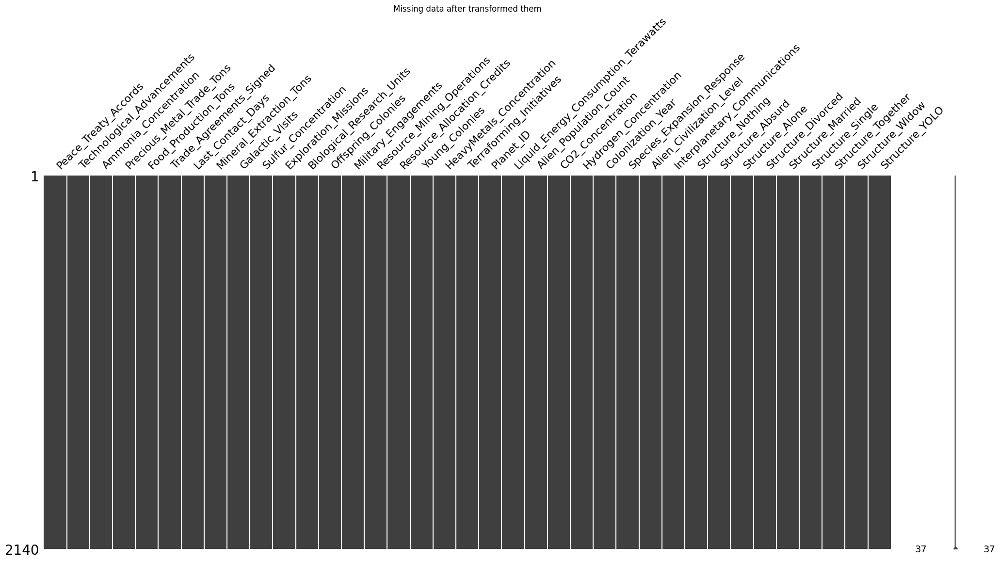

In [23]:
plt.figure(figsize=(6,3))
msno.matrix(aliens_imputed)
plt.title('Missing data after transformed them')
plt.show()

This last step is done to confirm that there are no more missing values as each column is inspected for completeness.

In [24]:
print(aliens_imputed.isnull().sum())

Peace_Treaty_Accords                   0
Technological_Advancements             0
Ammonia_Concentration                  0
Precious_Metal_Trade_Tons              0
Food_Production_Tons                   0
Trade_Agreements_Signed                0
Last_Contact_Days                      0
Mineral_Extraction_Tons                0
Galactic_Visits                        0
Sulfur_Concentration                   0
Exploration_Missions                   0
Biological_Research_Units              0
Offspring_Colonies                     0
Military_Engagements                   0
Resource_Mining_Operations             0
Resource_Allocation_Credits            0
Young_Colonies                         0
HeavyMetals_Concentration              0
Terraforming_Initiatives               0
Planet_ID                              0
Liquid_Energy_Consumption_Terawatts    0
Alien_Population_Count                 0
CO2_Concentration                      0
Hydrogen_Concentration                 0
Colonization_Yea

#  CORRELATION MATRIX 

Now we compute our first correlation matrix with all of our features. 

This will help us see highly correlated pairs and not important features that we can drop; they also could have been seen in the subgraph above. 

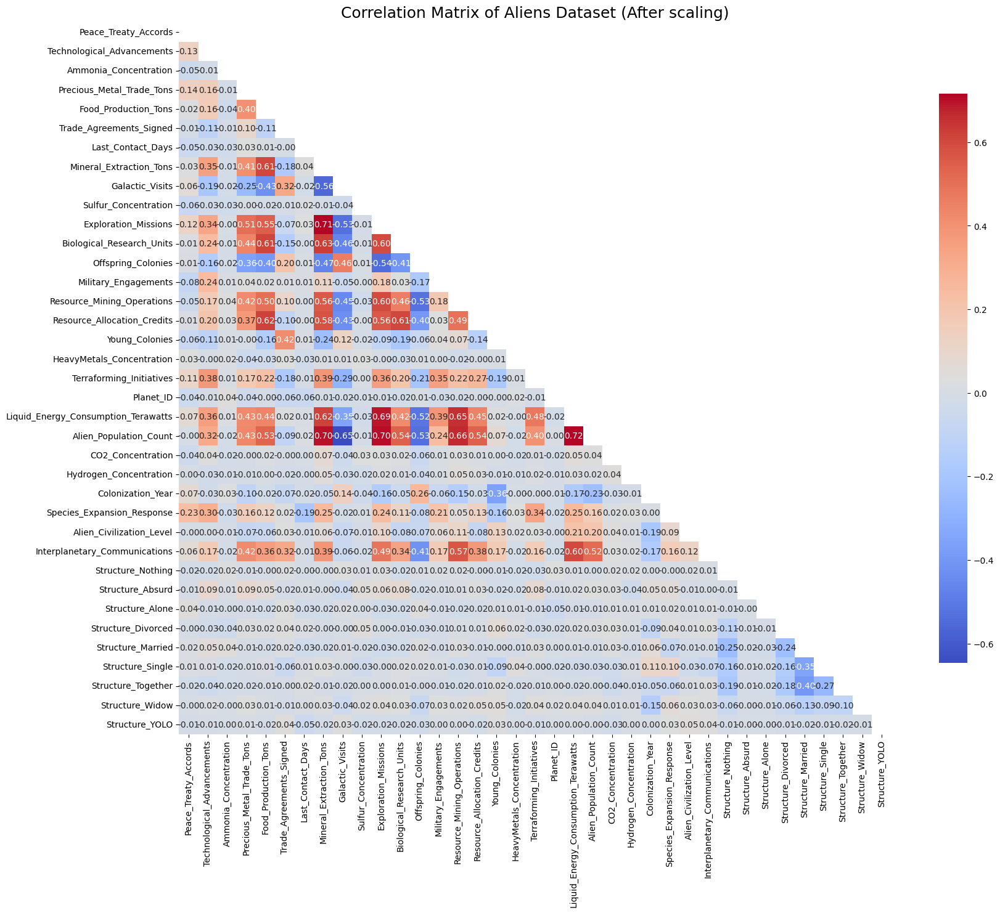

In [25]:

correlation_matrix = aliens_imputed.corr()


mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))


plt.figure(figsize=(20, 15))  
sns.heatmap(
    correlation_matrix, 
    mask=mask,            
    annot=True,           
    fmt=".2f",            
    cmap="coolwarm",      
    cbar_kws={"shrink": .8},  
    square=True
)
plt.title("Correlation Matrix of Aliens Dataset (After scaling)", fontsize=18)
plt.show()


We selected some features to drop because, as shown in the correlation matrix, they were not strongly correlated with any other features, making them less relevant for our analysis, so we dropped them.  We wanted to plot a correlation matrix with only the most correlated values. 

In [26]:
columns_to_drop_2 = ['Structure_Nothing', 'Structure_YOLO', 'Structure_Absurd' , 'Structure_Married','Structure_Alone','Structure_Divorced','Structure_Single', 'Structure_Together', 'Structure_Widow',
                     'Alien_Civilization_Level', 'CO2_Concentration', 'Hydrogen_Concentration', 'Colonization_Year', 'Planet_ID',
                     'Ammonia_Concentration', 'Sulfur_Concentration', 'HeavyMetals_Concentration', 'Precious_Metal_Trade_Tons', 'Trade_Agreements_Signed',
                     'Last_Contact_Days', 'Food_Production_Tons','Technological_Advancements', 'Peace_Treaty_Accords', 'Young_Colonies'  ]  
aliens_imputed.drop(columns=columns_to_drop_2, inplace=True)


After this, we compute the same correlation matrix, but only using the relevant features.


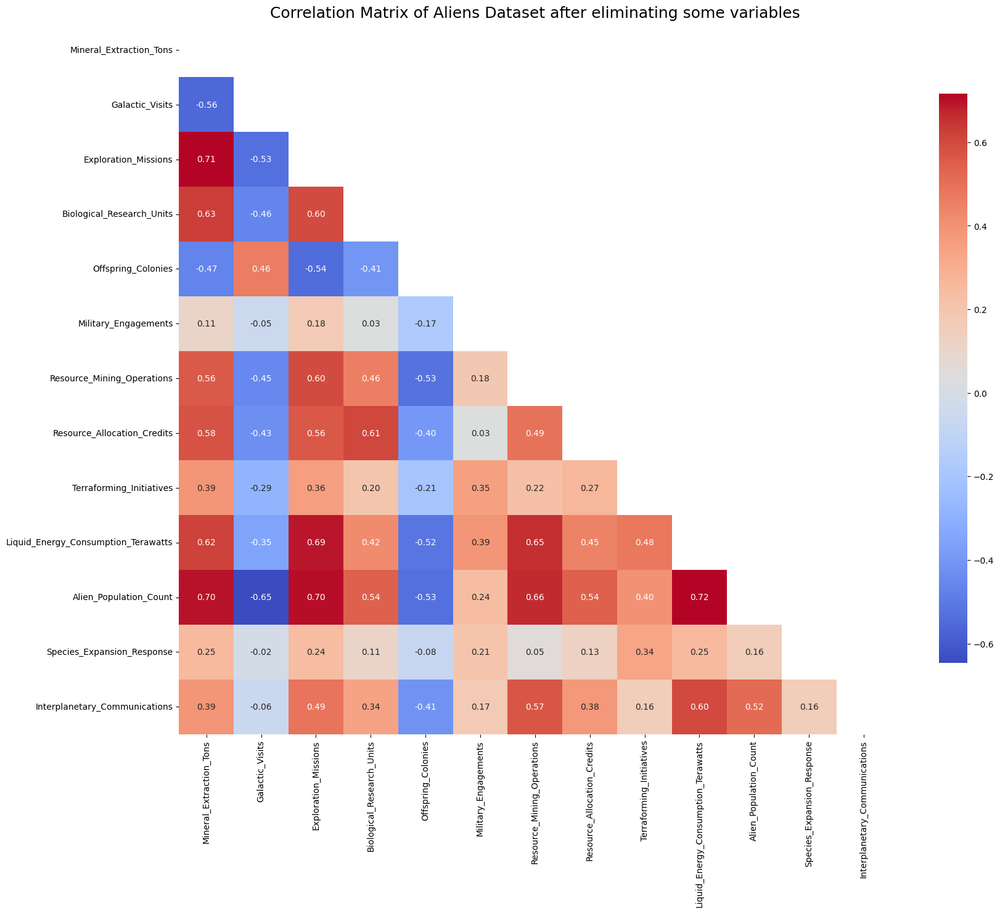

In [27]:

correlation_matrix = aliens_imputed.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(20, 15)) 
sns.heatmap(
    correlation_matrix, 
    mask=mask,            
    annot=True,           
    fmt=".2f",            
    cmap="coolwarm",      
    cbar_kws={"shrink": .8},  
    square=True
)
plt.title("Correlation Matrix of Aliens Dataset after eliminating some variables", fontsize=18)
plt.show()

## PAIRPLOT OF HIGHLY CORRELATED VARIABLES


The purpose of this next section of the code is to identify and display pairs of highly correlated variables in the dataset, based on a threshold of 0.7, which provides us with a sufficient number of pairs. The ultimate aim is to make the feature engineering to create new features combining the highly correlated variables. We are reviewing these results to determine which pairs might be combined for this purpose.

In [28]:
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)

corr_threshold = 0.7

# Identify pairs with high correlation
correlation_pairs = correlation_matrix.unstack().reset_index()
correlation_pairs.columns = ['Variable1', 'Variable2', 'Correlation']
correlation_pairs = correlation_pairs[correlation_pairs['Variable1'] != correlation_pairs['Variable2']]  # Avoid self-correlation
high_corr_pairs = correlation_pairs[correlation_pairs['Correlation'].abs() > corr_threshold]

# Remove duplicate pairs (A-B and B-A)
high_corr_pairs['SortedVars'] = high_corr_pairs.apply(lambda row: tuple(sorted([row['Variable1'], row['Variable2']])), axis=1)
high_corr_pairs = high_corr_pairs.drop_duplicates(subset=['SortedVars']).drop(columns=['SortedVars'])

# Display the table
print("Variables with a significant correlation value:")
high_corr_pairs = high_corr_pairs.sort_values(by='Correlation', ascending=False)
high_corr_pairs.reset_index(drop=True, inplace=True)
display(high_corr_pairs)

Variables with a significant correlation value:


,Variable1,Variable2,Correlation
0,Liquid_Energy_Consumption_Terawatts,Alien_Population_Count,0.715838
1,Mineral_Extraction_Tons,Exploration_Missions,0.714225
2,Exploration_Missions,Alien_Population_Count,0.704854


In [29]:

high_corr_vars = list(set(high_corr_pairs['Variable1']).union(set(high_corr_pairs['Variable2'])))



We then create a pairplot to visualize the correlations. 

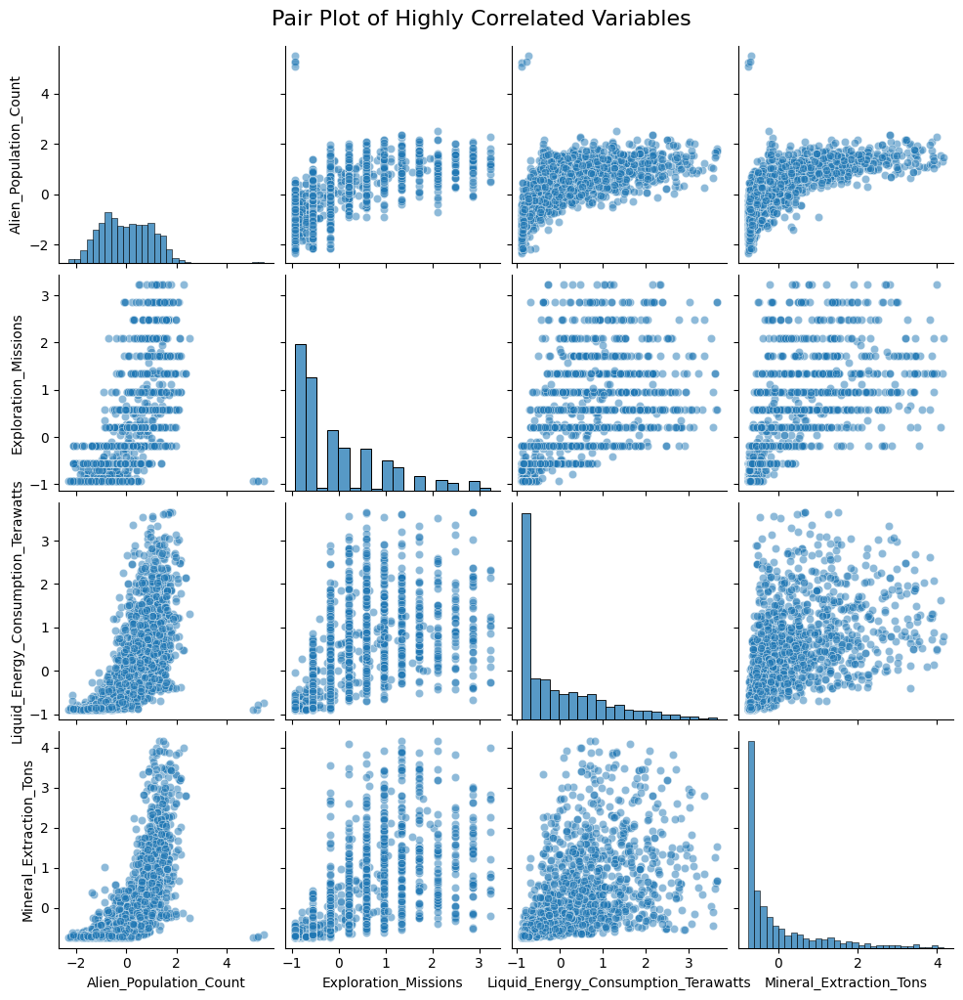

In [30]:

# Create pair plot for the selected variables
sns.pairplot(aliens_imputed[high_corr_vars], height=2.5, plot_kws={'alpha': 0.5})

# Set the main title
plt.suptitle("Pair Plot of Highly Correlated Variables", fontsize=16, y=1.02)
plt.show()


# CREATION OF NEW FEATURE : FEATURE ENGINEERING 

We now want to modify our dataset by combining multiple features into one to improve the performance of the model, and we can do this thanks to the correlations we saw before. 

- The first feature we create calculates the impact of energy consumption relative to the alien population by multiplying the two existing features. 

- The second one calculates the total energy consumption required per exploration mission by still multiplying the two. 

We avoided features where we had to divide by something, as we saw that we had many zeros in the data we wanted to use, and this didn't allow us to use divisions. 
Of course we needed to use the StandardScale also here.


In [31]:


aliens_imputed['Energy_Population_Impact'] = aliens_imputed['Liquid_Energy_Consumption_Terawatts'] * aliens_imputed['Alien_Population_Count']
aliens_imputed["Energy_per_Mission"] = aliens_imputed["Liquid_Energy_Consumption_Terawatts"] * aliens_imputed["Exploration_Missions"]


new_columns=[ "Energy_per_Mission" ,"Energy_Population_Impact"]



scaler = StandardScaler() 
aliens_imputed[new_columns] = scaler.fit_transform(aliens_imputed[new_columns])


table_data = aliens_imputed[[ "Energy_per_Mission" ,"Energy_Population_Impact"]].head()

styled_table = table_data.style.set_table_styles([
    {'selector': 'th', 'props': [('font-size', '12pt'), ('text-align', 'center'), ('font-weight', 'bold')]},
    {'selector': 'td', 'props': [('font-size', '10pt'), ('text-align', 'center')]}
]).set_properties(**{'border': '1px solid black', 'width': '100px'}).background_gradient(cmap='coolwarm', subset=table_data.columns)


styled_table



,Energy_per_Mission,Energy_Population_Impact
0,-0.063404,0.782813
1,0.460427,-0.203379
2,2.458380,0.495210
3,-0.650694,-0.772570
4,-0.673737,-0.752626



After this, we drop the features we used to create new ones as we don't need them anymore. 


In [32]:
aliens_imputed = aliens_imputed.drop(columns=['Exploration_Missions', 'Liquid_Energy_Consumption_Terawatts', 'Alien_Population_Count'])

#a rapid check if everything is ok
print(aliens_imputed.head())

   Mineral_Extraction_Tons  Galactic_Visits  Biological_Research_Units  \
0                 1.200574        -1.062176                   2.953219   
1                 0.641082        -1.503136                   0.203791   
2                 1.060701        -0.180258                   1.870111   
3                -0.487893         0.701661                  -0.608540   
4                 0.131545        -1.062176                   0.911977   

   Offspring_Colonies  Military_Engagements  Resource_Mining_Operations  \
0           -0.877871             -0.290505                    0.427290   
1           -0.877871              0.509599                    1.705280   
2           -0.877871             -0.290505                    2.344274   
3           -0.877871              3.710013                   -0.531202   
4           -0.877871             -0.290505                    0.746788   

   Resource_Allocation_Credits  Terraforming_Initiatives  \
0                     1.397359              

## Pairplot with all the variables 
This next part of the code is used to create a pairplot of all the features we are going to use. It’s a useful visualization to explore the relationships between them, trends and distribution in general, making it a valuable tool for out EDA. 


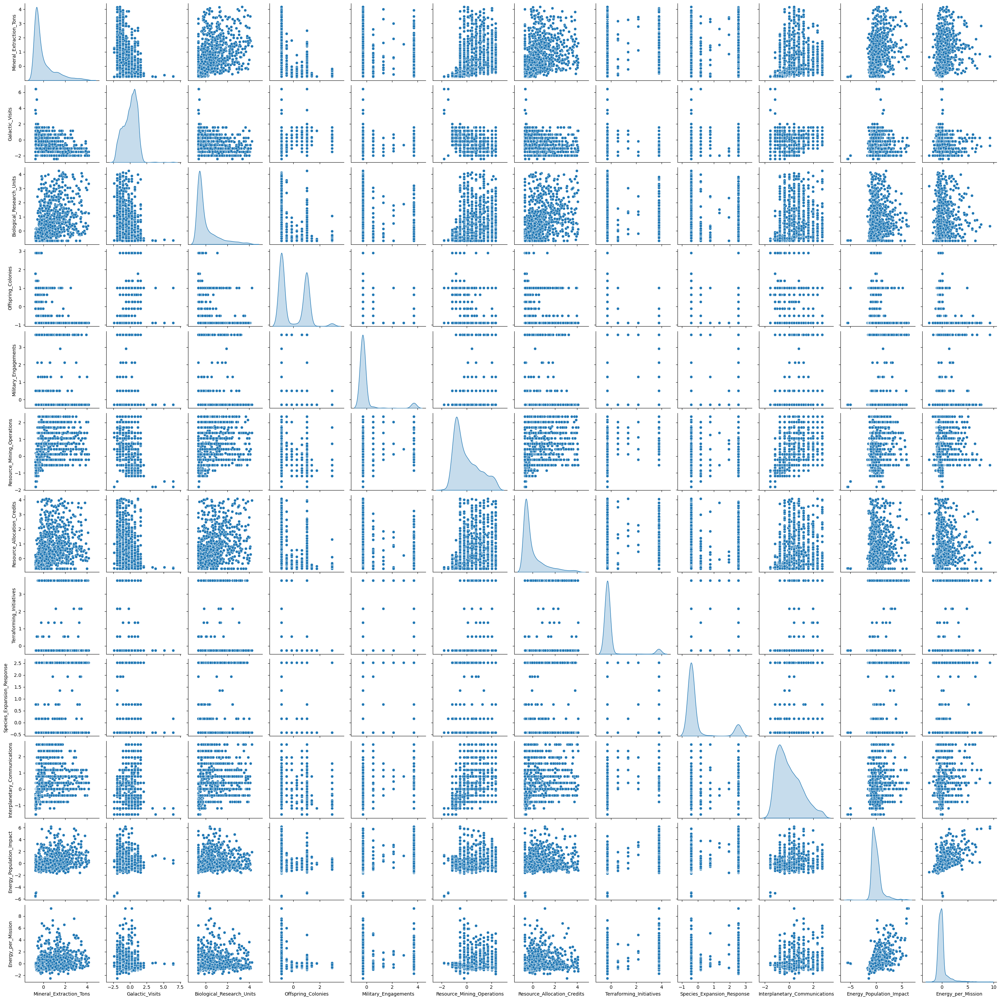

In [33]:

sns.pairplot(aliens_imputed, diag_kind="kde")


plt.show()

# Setting up our Clustering Problem  


After completing the Exploratory Data Analysis (EDA), we applied several clustering algorithms to identify clusters and understand the most important features for each one. We chose the following algorithms:

•	K-Means Clustering

•	Agglomerative Clustering

•	DBSCAN


In [34]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch

We now apply PCA with 2 components to our dataset in order to facilitate clustering and visualization.

In [35]:
# Set up our PCA
pca = PCA(n_components=2)  
aliens_pca = pca.fit_transform(aliens_imputed) # settiamo la nostra aliens_pca


## First method: K_means;  computing the elbow method, silhouette score 

**K-Means:** We first used the Elbow Method and Silhouette Score to determine the optimal number of clusters. We tested the silhouette score for a range of cluster values from 2 to 10 and found the highest score (0.5623) with 3 clusters.

K-Means with 2 cluster - Silhouette Score: 0.5440
K-Means with 3 cluster - Silhouette Score: 0.5623
K-Means with 4 cluster - Silhouette Score: 0.4831
K-Means with 5 cluster - Silhouette Score: 0.4756
K-Means with 6 cluster - Silhouette Score: 0.4838
K-Means with 7 cluster - Silhouette Score: 0.4263
K-Means with 8 cluster - Silhouette Score: 0.3603
K-Means with 9 cluster - Silhouette Score: 0.3414
K-Means with 10 cluster - Silhouette Score: 0.3493


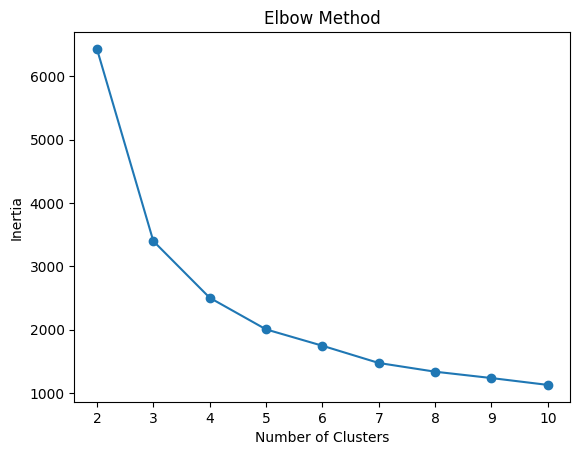

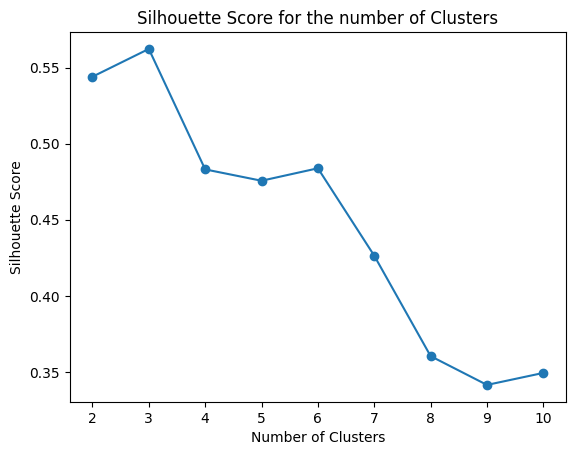


Best number of clusters for K-Means( based on Silhouette Score): 3
Silhouette Score : 0.5623


In [36]:
# We set up different hyperparameters
inertia = []
silhouette_scores = []
range_clusters = range(2, 11) 

for k in range_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(aliens_pca)
    inertia.append(kmeans.inertia_)
    score = silhouette_score(aliens_pca, kmeans.labels_)
    silhouette_scores.append(score)
    print(f"K-Means with {k} cluster - Silhouette Score: {score:.4f}")

# 4. Plot Elbow Method
plt.figure()
plt.plot(range_clusters, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

# 5. Plot Silhouette Score
plt.figure()
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for the number of Clusters')
plt.show()

# 6. Determine th ebest number of clusters based on the silhouette score
optimal_k = range_clusters[np.argmax(silhouette_scores)]
print(f"\nBest number of clusters for K-Means( based on Silhouette Score): {optimal_k}")
print(f"Silhouette Score : {max(silhouette_scores):.4f}")


### K-Means with the best hyperparameter

We run the K-Means algorithm on our dataset. First, we plot the results in 2D. In the second part of the code, we apply PCA with 3 components to enable us to plot the clustering in 3D as well.


Remember to check for : 
1) install in your terminal : pip install ipympl

2) check for pip install nbformat

Otherwise the ipynb will not understand the matplotlib widget, and the 3d graph will not be interactive as they should.

In [37]:
# !pip install ipympl
# !pip install nbformat 

In [38]:
%matplotlib widget

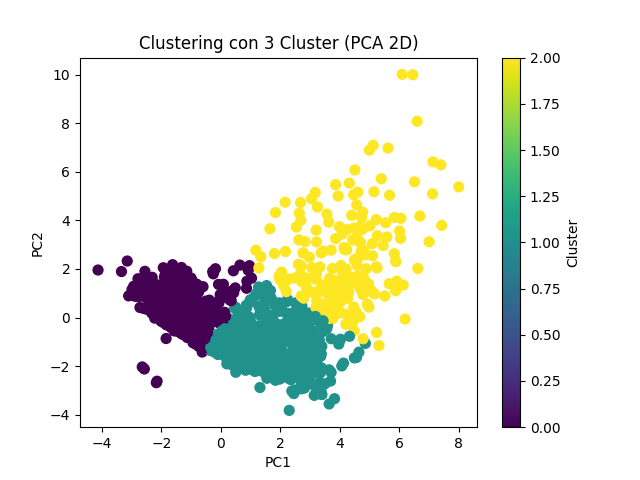

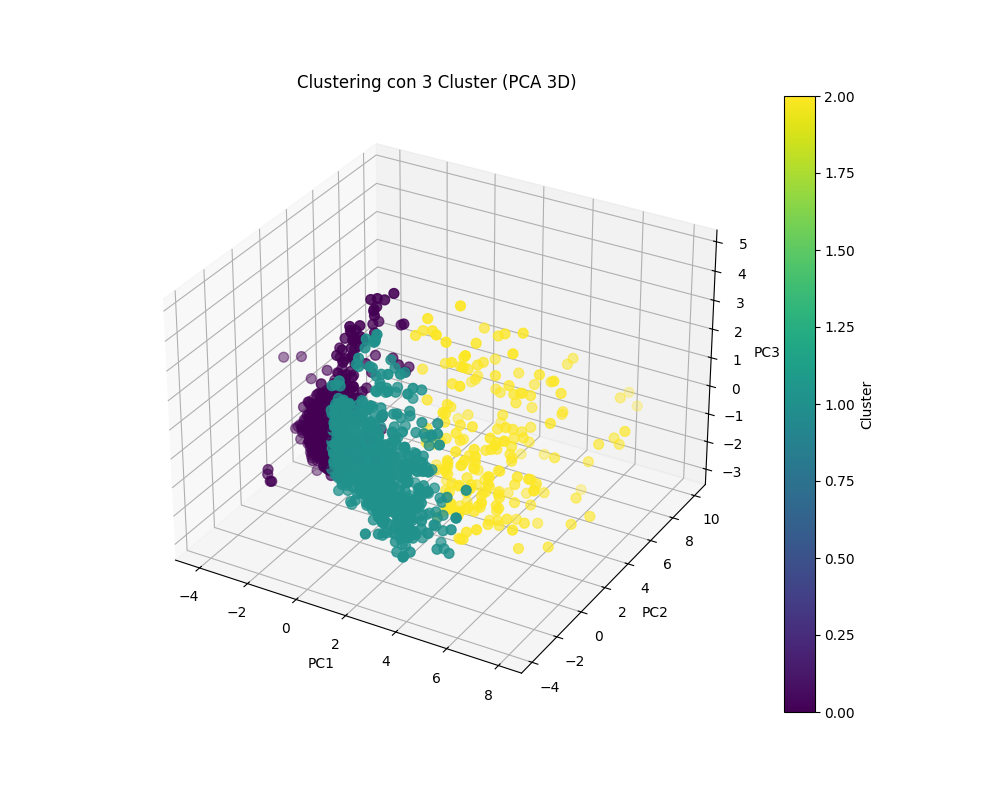

In [39]:

kmeans_final = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans_final.fit_predict(aliens_pca)

# 2d visualization
plt.figure()
plt.scatter(aliens_pca[:, 0], aliens_pca[:, 1], c=clusters, cmap='viridis', s=50)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'Clustering con {optimal_k} Cluster (PCA 2D)')
plt.colorbar(label='Cluster')
plt.show()

# 3d visualization
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

pca_3d = PCA(n_components=3)
aliens_3d = pca_3d.fit_transform(aliens_imputed)


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


sc = ax.scatter(
    aliens_3d[:, 0], aliens_3d[:, 1], aliens_3d[:, 2],
    c=clusters, cmap='viridis', s=50
)


ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'Clustering con {optimal_k} Cluster (PCA 3D)')


plt.colorbar(sc, ax=ax, label='Cluster')


plt.show()



The clusters appear to be distinct, with different densities and shapes, suggesting a clear separation between the groups. However, there is a small amount of overlap between some of the clusters.

## Second method: Agglomerative clustering 

We are searching for the best hyperparameters, specifically the linkage method and the number of clusters. We print the silhouette score for each combination of these two parameters for a range of clusters from 2 to 5. The best parameters, which give the highest silhouette score of 0.7434, are obtained with 2 clusters.

In [41]:
linkages = ['ward', 'complete', 'average', 'single']  
range_clusters = range(2, 6)  
results = []

for linkage in linkages:
    for k in range_clusters:
        agg_clustering = AgglomerativeClustering(n_clusters=k, linkage=linkage)
        agg_labels = agg_clustering.fit_predict(aliens_pca)
        score = silhouette_score(aliens_pca, agg_labels)
        results.append((linkage, k, score))
        print(f"Agglomerative with linkage={linkage}, {k} cluster - Silhouette Score: {score:.4f}")


best_linkage, best_k, best_silhouette = max(results, key=lambda x: x[2])
print(f"\nBest parameters: linkage={best_linkage}, number of clusters={best_k}, Silhouette Score={best_silhouette:.4f}")


Agglomerative with linkage=ward, 2 cluster - Silhouette Score: 0.4975
Agglomerative with linkage=ward, 3 cluster - Silhouette Score: 0.5431
Agglomerative with linkage=ward, 4 cluster - Silhouette Score: 0.4710
Agglomerative with linkage=ward, 5 cluster - Silhouette Score: 0.3580
Agglomerative with linkage=complete, 2 cluster - Silhouette Score: 0.6742
Agglomerative with linkage=complete, 3 cluster - Silhouette Score: 0.5241
Agglomerative with linkage=complete, 4 cluster - Silhouette Score: 0.5190
Agglomerative with linkage=complete, 5 cluster - Silhouette Score: 0.4985
Agglomerative with linkage=average, 2 cluster - Silhouette Score: 0.7434
Agglomerative with linkage=average, 3 cluster - Silhouette Score: 0.5635
Agglomerative with linkage=average, 4 cluster - Silhouette Score: 0.5287
Agglomerative with linkage=average, 5 cluster - Silhouette Score: 0.4843
Agglomerative with linkage=single, 2 cluster - Silhouette Score: 0.7434
Agglomerative with linkage=single, 3 cluster - Silhouette Sc

### Application of Agglomerative Clustering with best hyperparameters

We run the Agglomerative Clustering algorithm on our dataset with the parameters we defined earlier, both in 2D and 3D.

In [42]:
%matplotlib widget

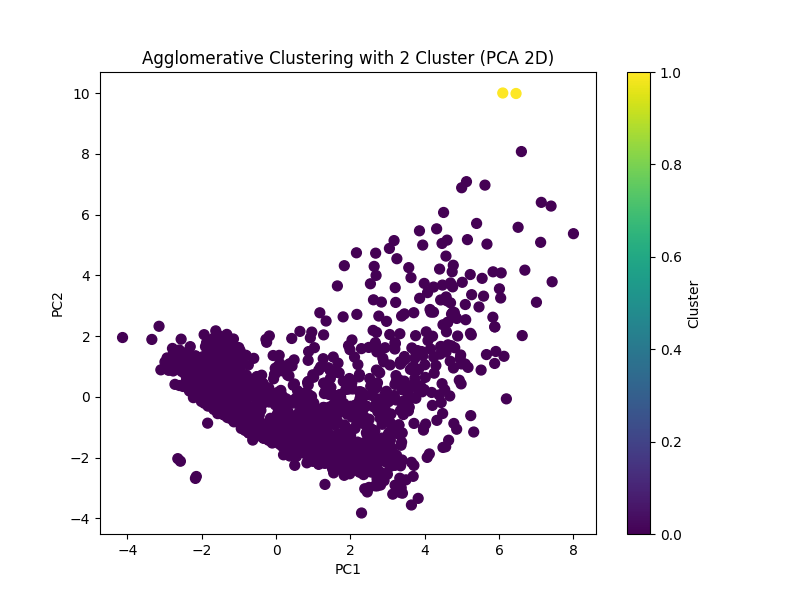

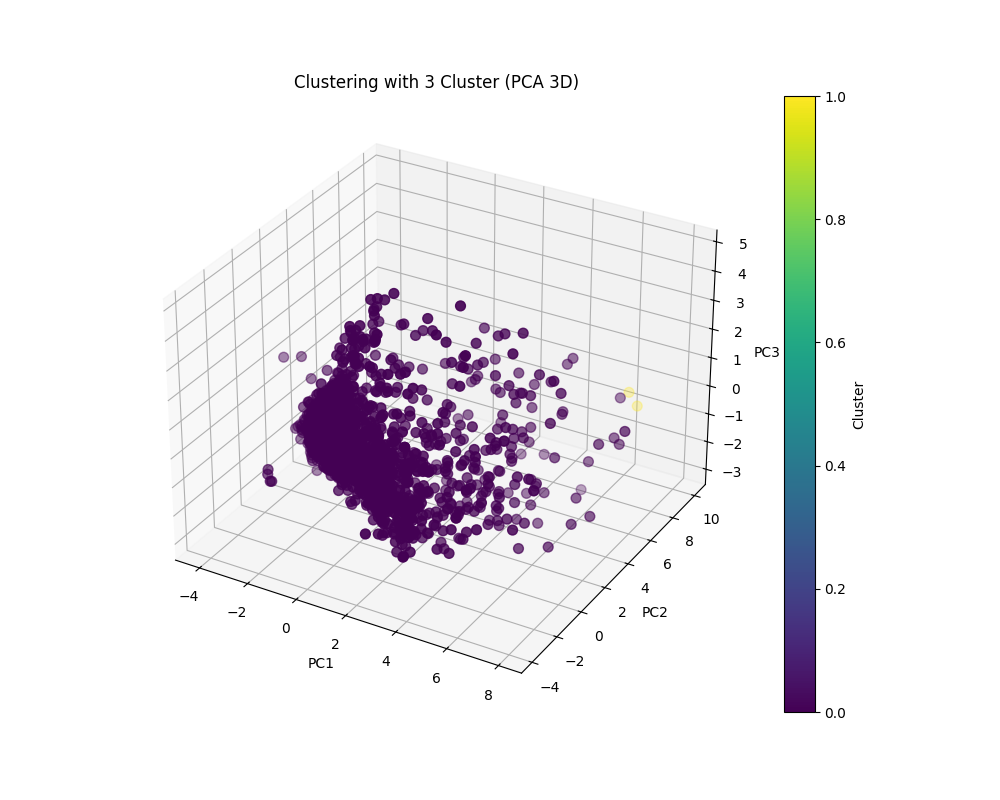

In [43]:
agg_clustering = AgglomerativeClustering(n_clusters=best_k, linkage=best_linkage) 
agg_clusters = agg_clustering.fit_predict(aliens_pca)

#2d display
plt.figure(figsize=(8, 6))
plt.scatter(
    aliens_pca[:, 0], aliens_pca[:, 1], 
    c=agg_clusters, cmap='viridis', s=50
)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'Agglomerative Clustering with {best_k} Cluster (PCA 2D)')
plt.colorbar(label='Cluster')
plt.show()


from mpl_toolkits.mplot3d import Axes3D

# 3d display
pca_3d = PCA(n_components=3)  
aliens_3d = pca_3d.fit_transform(aliens_imputed)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    aliens_3d[:, 0], aliens_3d[:, 1], aliens_3d[:, 2],
    c=agg_clusters, cmap='viridis', s=50
)


ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'Clustering with {optimal_k} Cluster (PCA 3D)')

plt.colorbar(sc, label='Cluster')
plt.show()





Although the silhouette score is quite high, the plot is not particularly helpful because it identifies all points as belonging to one cluster, with only two points in the other cluster. We decide to proceed and explore if we can improve the plot with a slight sacrifice in the silhouette score. 

After several attempts, we achieved a better plot with a silhouette score of 0.54, which is slightly lower than the score obtained with K-Means.
To achieve this result, we used the following parameters:

•	Linkage: Ward

•	Number of clusters: 3


### Application of Agglomerative Clustering with:
- Number of clusters= 3
- Linkage= ward 


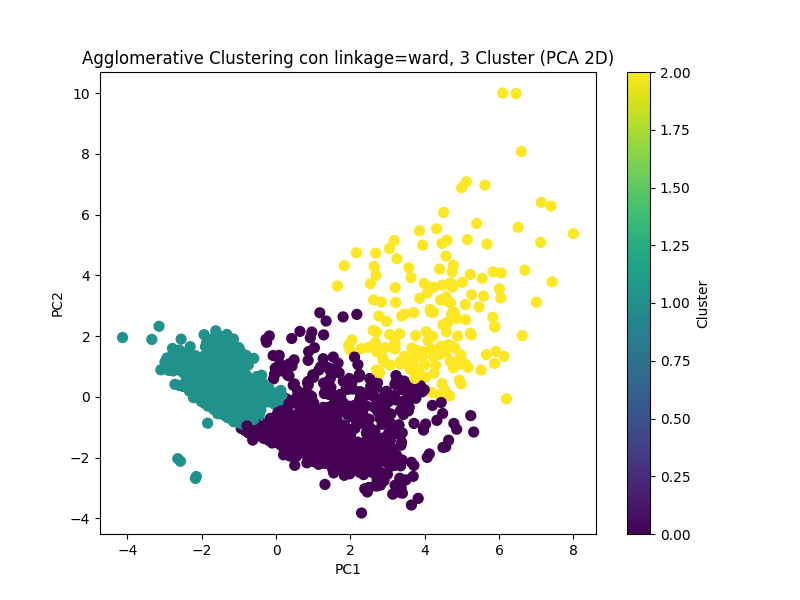

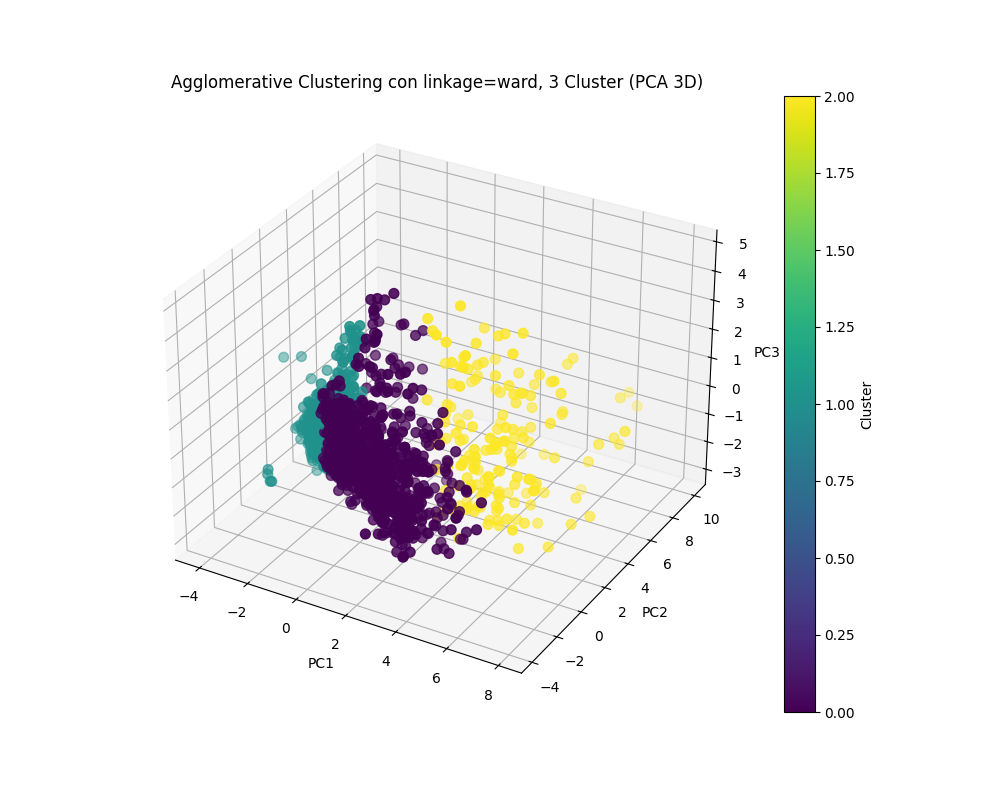

In [ ]:
# Applying the Agglomerative Clustering with 3 cluster and ward (even if the silhouette score is 0.54)
agg_clustering = AgglomerativeClustering(n_clusters=3, linkage='ward')
agg_clusters2 = agg_clustering.fit_predict(aliens_pca)

# 2D
plt.figure(figsize=(8, 6))
plt.scatter(
    aliens_pca[:, 0], aliens_pca[:, 1],
    c=agg_clusters2, cmap='viridis', s=50
)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'Agglomerative Clustering with linkage={'ward'}, 3 Cluster (PCA 2D)')
plt.colorbar(label='Cluster')
plt.show()

# 3D
pca_3d = PCA(n_components=3)
aliens_3d = pca_3d.fit_transform(aliens_imputed)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    aliens_3d[:, 0], aliens_3d[:, 1], aliens_3d[:, 2],
    c=agg_clusters2, cmap='viridis', s=50
)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'Agglomerative Clustering with linkage={'ward'}, 3 Cluster (PCA 3D)')
plt.colorbar(sc, label='Cluster')
plt.show()


This plot illustrates the results of Agglomerative Clustering with three distinct clusters, visualized in both 2D and 3D spaces. The clusters are well-separated, with varying densities and shapes, indicating clear group differentiation. However, slight overlap is observed between the purple and teal clusters.

# Third method: DBSCAN

As with the previous algorithms, we performed hyperparameter tuning to find the best parameters. We printed the results for each combination and selected the one with the highest silhouette score, which was 0.5827, obtained with the following parameters:

•	Eps: 0.6

•	Min Samples: 3

•	Number of clusters: 2


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

eps_values = np.arange(0.1, 1.5, 0.1)
min_samples_values = range(3, 10)
results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(aliens_pca)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        # consider only the case with at least 2 clusters and not more than 4 
        if 2 <= n_clusters <= 4:
            score = silhouette_score(aliens_pca, labels)
            results.append((eps, min_samples, n_clusters, score))
            print(f"DBSCAN with eps={eps}, min_samples={min_samples} - Silhouette Score: {score:.4f}, Number di cluster: {n_clusters}")


if results:
    best_eps, best_min_samples, best_n_clusters, best_silhouette = max(results, key=lambda x: x[3])
    print(f"\nBest parameters: eps={best_eps}, min_samples={best_min_samples}, Number of cluster={best_n_clusters}, Silhouette Score={best_silhouette:.4f}")
else:
    print("\nNo combination of parameters have produced a number between 2 and 4.")


DBSCAN con eps=0.1, min_samples=9 - Silhouette Score: 0.0863, Numero di cluster: 2
DBSCAN con eps=0.30000000000000004, min_samples=9 - Silhouette Score: -0.0583, Numero di cluster: 4
DBSCAN con eps=0.4, min_samples=4 - Silhouette Score: 0.0714, Numero di cluster: 4
DBSCAN con eps=0.4, min_samples=5 - Silhouette Score: 0.1045, Numero di cluster: 3
DBSCAN con eps=0.4, min_samples=6 - Silhouette Score: 0.4871, Numero di cluster: 3
DBSCAN con eps=0.4, min_samples=7 - Silhouette Score: 0.3770, Numero di cluster: 3
DBSCAN con eps=0.4, min_samples=8 - Silhouette Score: 0.4874, Numero di cluster: 2
DBSCAN con eps=0.4, min_samples=9 - Silhouette Score: 0.3214, Numero di cluster: 3
DBSCAN con eps=0.5, min_samples=3 - Silhouette Score: 0.5131, Numero di cluster: 2
DBSCAN con eps=0.5, min_samples=4 - Silhouette Score: 0.5215, Numero di cluster: 2
DBSCAN con eps=0.5, min_samples=5 - Silhouette Score: 0.4880, Numero di cluster: 2
DBSCAN con eps=0.5, min_samples=6 - Silhouette Score: 0.3719, Numero d

### Application of DBSCAN with best hyperparameters

We apply these parameters and run the DBSCAN algorithm. We then plot the results in both 2D and 3D.

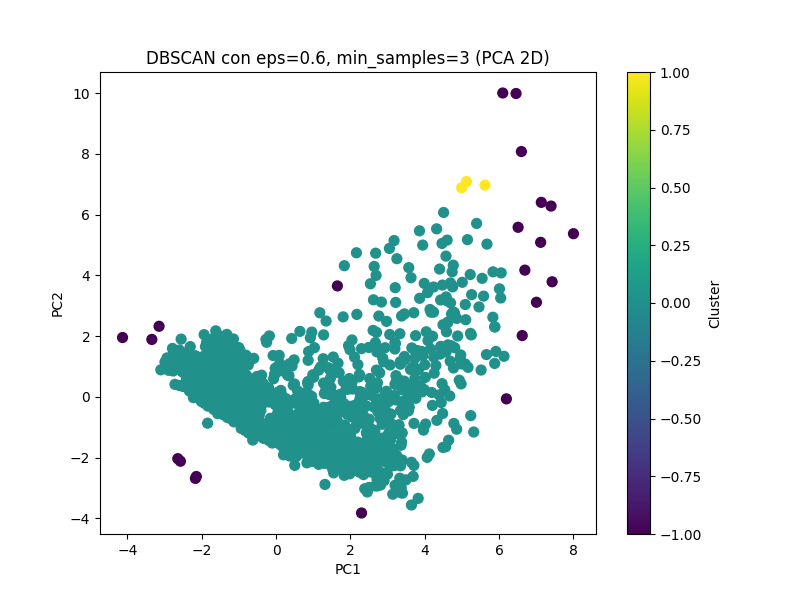

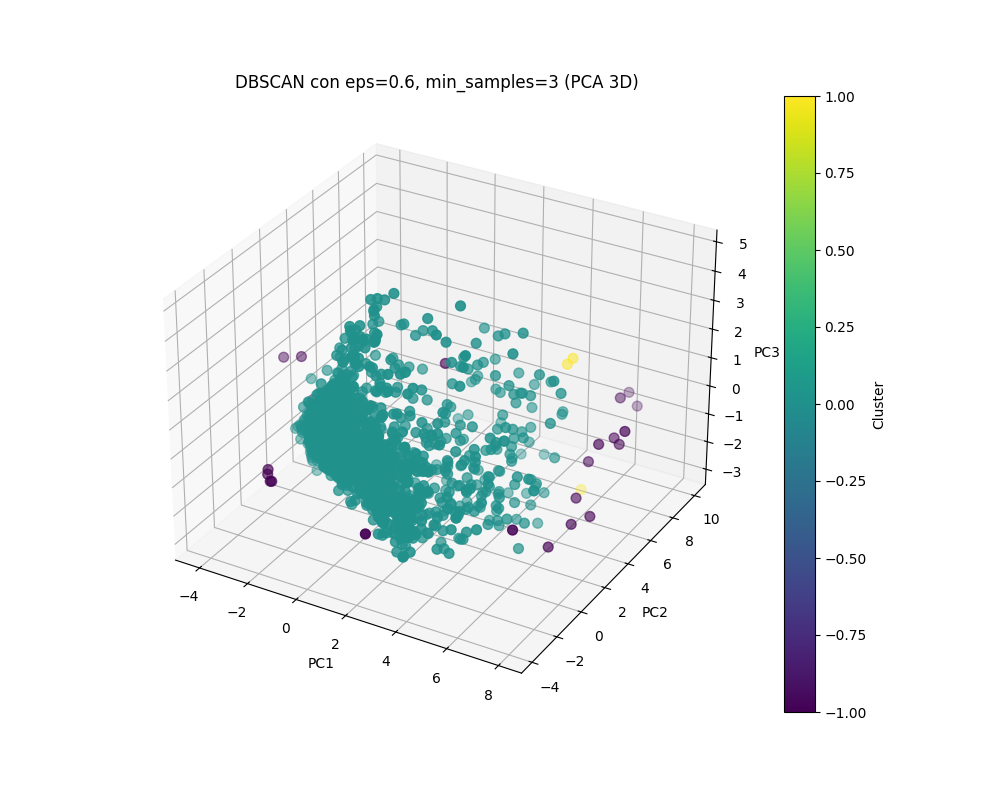

In [52]:

dbscan_best = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = dbscan_best.fit_predict(aliens_pca)

# 2d visualization
plt.figure(figsize=(8, 6))
plt.scatter(
    aliens_pca[:, 0], aliens_pca[:, 1],
    c=best_labels, cmap='viridis', s=50
)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'DBSCAN con eps={best_eps}, min_samples={best_min_samples} (PCA 2D)')
plt.colorbar(label='Cluster')
plt.show()

# 3d visualization
pca_3d = PCA(n_components=3)
aliens_3d = pca_3d.fit_transform(aliens_imputed)


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    aliens_3d[:, 0], aliens_3d[:, 1], aliens_3d[:, 2],
    c=best_labels, cmap='viridis', s=50
)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'DBSCAN con eps={best_eps}, min_samples={best_min_samples} (PCA 3D)')
plt.colorbar(sc, label='Cluster')
plt.show()


In this graph, we observe two clusters: the teal and the yellow clusters, as well as points identified as outliers in purple. As with Agglomerative Clustering, we have one large cluster and a small cluster composed of only three points.
At this point, we concluded that three clusters seemed appropriate for our dataset. 

Thus, we applied the parameters that led to the highest silhouette score, fixing the number of clusters to 3. Unfortunately, the silhouette score was very low, and the clustering results did not significantly improve in terms of cluster visualization.


### Application of DBSCAN with: 
- Number of Clusters = 3, 
- Parameters: eps=0.90, 
- min_samples=3, 
- Silhouette Score: 0.1961

DBSCAN with eps=0.9, min_samples=3 - Silhouette Score: 0.1961, Number of cluster: 3


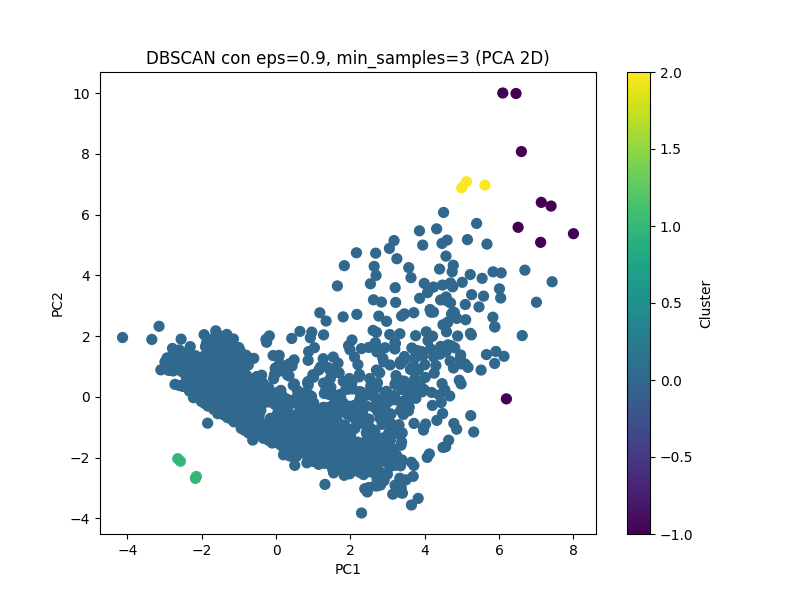

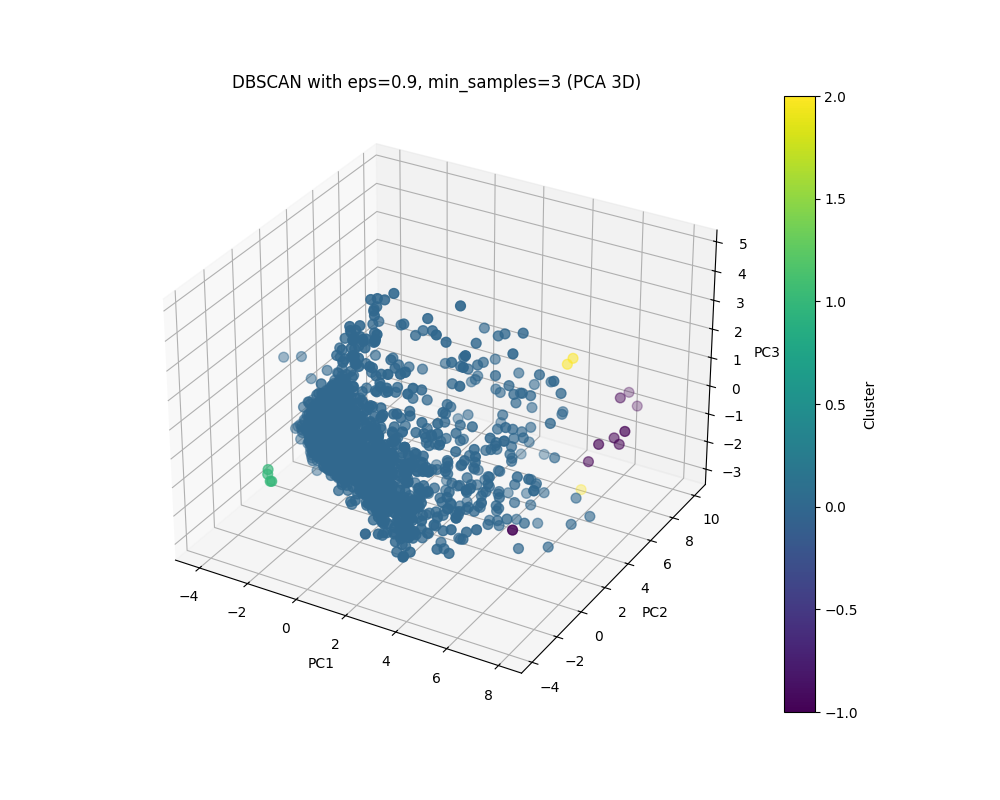

In [47]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

eps = 0.90
min_samples = 3

dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(aliens_pca)

n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
score = silhouette_score(aliens_pca, labels)

print(f"DBSCAN with eps={eps}, min_samples={min_samples} - Silhouette Score: {score:.4f}, Number of cluster: {n_clusters}")

# 2D
plt.figure(figsize=(8, 6))
plt.scatter(
    aliens_pca[:, 0], aliens_pca[:, 1],
    c=labels, cmap='viridis', s=50
)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'DBSCAN con eps={eps}, min_samples={min_samples} (PCA 2D)')
plt.colorbar(label='Cluster')
plt.show()

# 3D
pca_3d = PCA(n_components=3)
aliens_3d = pca_3d.fit_transform(aliens_imputed)


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    aliens_3d[:, 0], aliens_3d[:, 1], aliens_3d[:, 2],
    c=labels, cmap='viridis', s=50
)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'DBSCAN with eps={eps}, min_samples={min_samples} (PCA 3D)')
plt.colorbar(sc, label='Cluster')
plt.show()



##### Key Takeaways between the 3 methods:
-	**K-Means** showed reasonable cluster separation with 3 clusters and the highest silhouette score between the three methods adopting n=3 clusters.
-	**Agglomerative Clustering** performed visually better with 3 clusters after multiple attempts, despite a slightly lower silhouette score compared to K-Means.
-	**DBSCAN** struggled to improve the visualization when fixing the number of clusters to 3, as it did not yield better results than Agglomerative or K-Means in this case.



### Calculation of the Density Between Agglomerative Clustering and K-Means  

We wanted to analyze how compact the clusters were inside **K-Means** and **Agglomerative Clustering**.  

**Density** measures how close the points in a cluster are to their center. It provides an idea of how "tight" or "spread out" a cluster is, which helps determine how effectively a method groups similar data points.  

- **Lower density** typically indicates tighter, more well-defined clusters, which is desirable.  
- Using density as a statistic to compare clustering algorithms can yield helpful insights, but it should be considered alongside:  
  - **Silhouette score**  
  - **Visualization analysis**  

These additional factors are crucial for a comprehensive evaluation of the clustering methods.  


In [ ]:

from sklearn.metrics import pairwise_distances


def calculate_cluster_density(data, labels):
    densities = []
    for cluster in np.unique(labels):
         
        cluster_points = data[labels == cluster]
        
        centroid = cluster_points.mean(axis=0)
        
        distances = pairwise_distances(cluster_points, [centroid])
        
        densities.append(distances.mean())
    return densities


agg_cluster_labels = agg_clusters2
agg_densities = calculate_cluster_density(aliens_imputed.values, agg_cluster_labels)


kmeans_labels = clusters  
kmeans_densities = calculate_cluster_density(aliens_imputed.values, kmeans_labels)



print("Average cluster density (Agglomerative):", round(np.mean(agg_densities), 4))
print("Average cluster density (K-Means):", round(np.mean(kmeans_densities), 4))


Average cluster density (Agglomerative): 3.0478
Average cluster density (K-Means): 3.0539


## Showing and analysing the data inside each cluster  for each method
### Agglomerative Clustering , K-Means and DBSCAN 

Average statistics for each cluster of Agglomerative Clustering:


,Mineral_Extraction_Tons,Galactic_Visits,Biological_Research_Units,Offspring_Colonies,Military_Engagements,Resource_Mining_Operations,Resource_Allocation_Credits,Terraforming_Initiatives,Species_Expansion_Response,Interplanetary_Communications,Energy_Population_Impact,Energy_per_Mission
Cluster_Agglomerative,,,,,,,,,,,,
0,0.549570,-0.525522,0.583588,-0.678837,-0.034985,0.839525,0.563546,-0.174430,-0.098041,0.668301,-0.255021,-0.195405
1,-0.608014,0.509602,-0.544256,0.593640,-0.169005,-0.702887,-0.545151,-0.271478,-0.127486,-0.566897,-0.137474,-0.163210
2,1.523452,-0.967240,0.926484,-0.808776,1.319115,0.787007,1.028202,2.682977,1.336863,0.676714,2.153848,2.044906


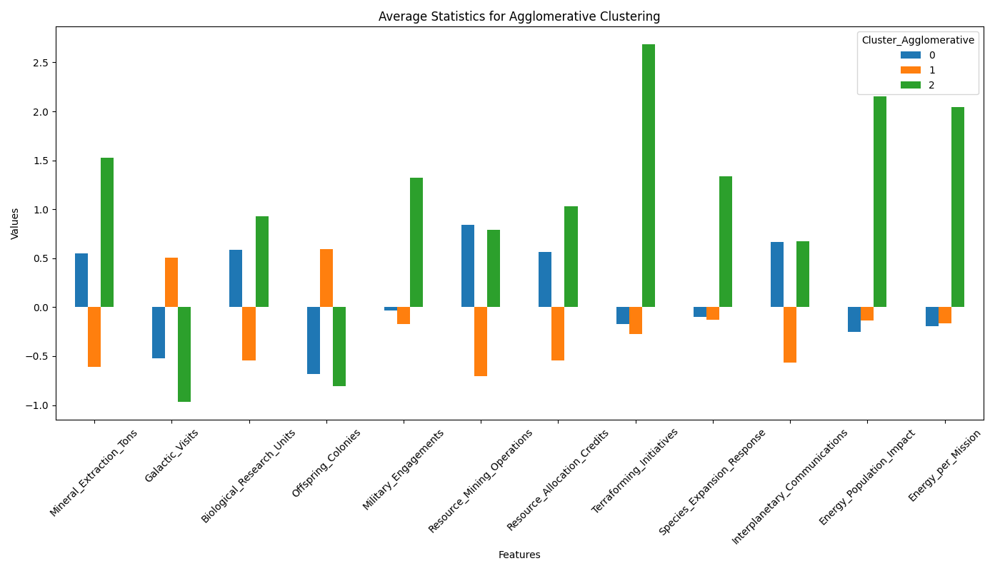

Average statistics for each cluster of K-Means Clustering:


,Mineral_Extraction_Tons,Galactic_Visits,Biological_Research_Units,Offspring_Colonies,Military_Engagements,Resource_Mining_Operations,Resource_Allocation_Credits,Terraforming_Initiatives,Species_Expansion_Response,Interplanetary_Communications,Energy_Population_Impact,Energy_per_Mission
Cluster_KMeans,,,,,,,,,,,,
0,-0.590679,0.494488,-0.533248,0.530123,-0.113275,-0.639513,-0.534874,-0.270176,-0.109352,-0.481799,-0.161761,-0.183062
1,0.611173,-0.608654,0.684908,-0.725216,-0.135089,0.913478,0.659513,-0.225946,-0.162741,0.680006,-0.270018,-0.212131
2,1.563928,-0.970439,0.946811,-0.786475,1.181043,0.813898,1.045685,2.480763,1.253056,0.641797,1.955865,1.887065


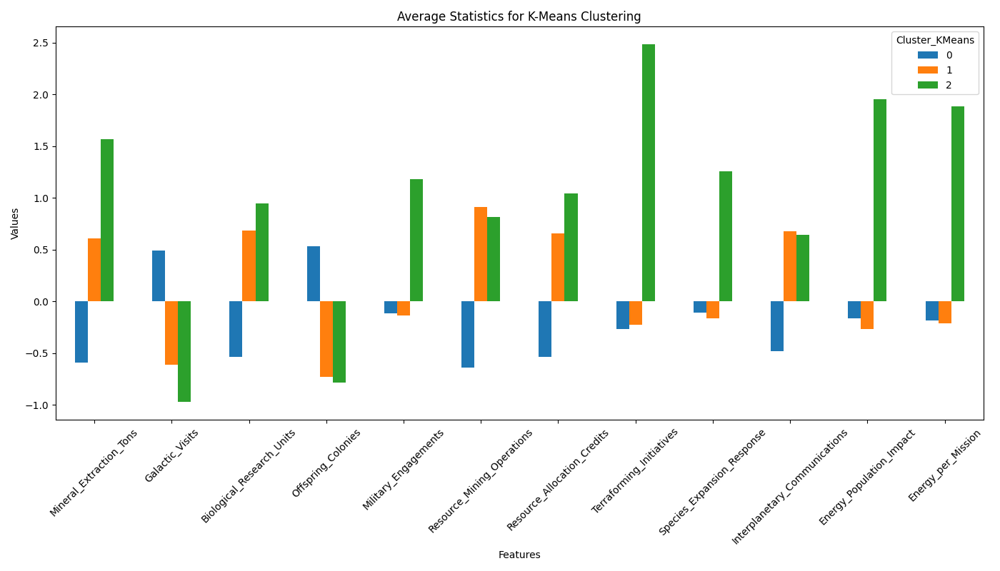

Average statistics for each cluster of DBSCAN (excluding noise):


,Mineral_Extraction_Tons,Galactic_Visits,Biological_Research_Units,Offspring_Colonies,Military_Engagements,Resource_Mining_Operations,Resource_Allocation_Credits,Terraforming_Initiatives,Species_Expansion_Response,Interplanetary_Communications,Energy_Population_Impact,Energy_per_Mission
Cluster_DBSCAN,,,,,,,,,,,,
0,-0.010186,0.009787,-0.005536,0.004829,-0.014763,0.001444,-0.005557,-0.018966,-0.012116,-0.002178,-0.017213,-0.030552
1,-0.717684,-2.164575,-0.660612,0.069408,-0.290505,-1.649442,-0.671530,-0.271478,-0.416114,-1.459931,-5.246802,0.066376
2,1.519951,-0.973984,-0.309991,-0.877871,2.376507,0.278192,-0.299390,3.785529,1.547035,1.178400,5.347682,5.164039


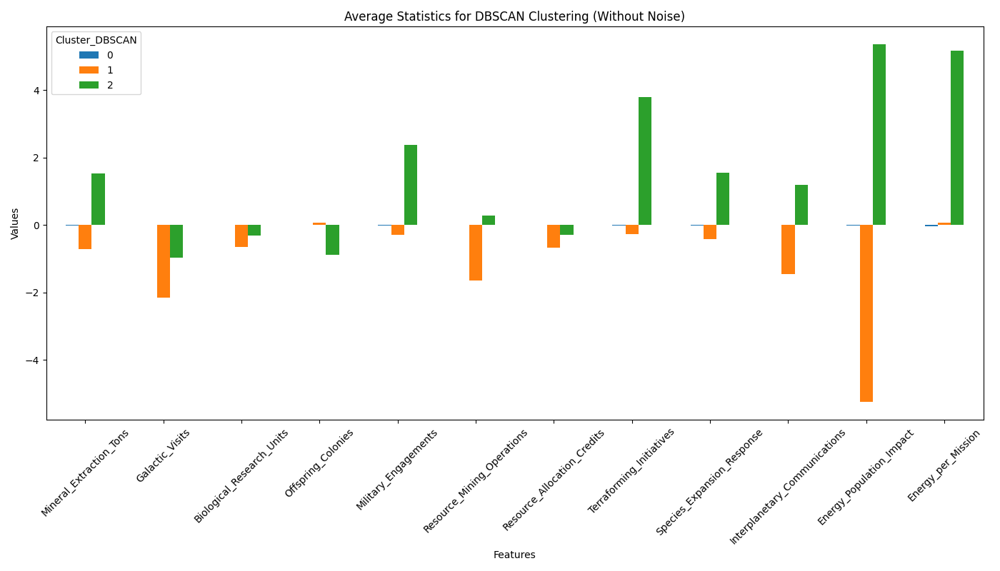

In [50]:
from IPython.display import display

agg_data = aliens_imputed.copy()
agg_data['Cluster_Agglomerative'] = agg_clusters2  # Agglomerative Clustering

kmeans_data = aliens_imputed.copy()
kmeans_data['Cluster_KMeans'] = clusters  # K-Means

dbscan_data = aliens_imputed.copy()
dbscan_data['Cluster_DBSCAN'] = labels  # DBSCAN

# we create histograms to understand the variables inside each cluster
def plot_histograms(cluster_descriptions, method_name):
    cluster_descriptions.T.plot(
        kind='bar', 
        figsize=(14, 8),
        title=f"Average Statistics for {method_name}",
        legend=True
    )
    plt.ylabel("Values")
    plt.xlabel("Features")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Agglomerative Clustering
print("Average statistics for each cluster of Agglomerative Clustering:")
agg_cluster_descriptions = agg_data.groupby('Cluster_Agglomerative').mean()
display(agg_cluster_descriptions)
plot_histograms(agg_cluster_descriptions, "Agglomerative Clustering")

# K-Means Clustering
print("Average statistics for each cluster of K-Means Clustering:")
kmeans_cluster_descriptions = kmeans_data.groupby('Cluster_KMeans').mean()
display(kmeans_cluster_descriptions)
plot_histograms(kmeans_cluster_descriptions, "K-Means Clustering")

# DBSCAN Clustering (Excluding noises)
print("Average statistics for each cluster of DBSCAN (excluding noise):")
valid_dbscan_data = dbscan_data[dbscan_data['Cluster_DBSCAN'] != -1]  # Escludi il rumore
valid_dbscan_cluster_descriptions = valid_dbscan_data.groupby('Cluster_DBSCAN').mean()
display(valid_dbscan_cluster_descriptions)
plot_histograms(valid_dbscan_cluster_descriptions, "DBSCAN Clustering (Without Noise)")


# Considerations on Each Cluster for Each Method

Analysis of the clusters generated by each method, highlighting attractive factors and weak factors within each cluster.

---

## 1. K-Means Clustering
K-Means produced well-separated clusters with the following characteristics:

- **Cluster 0**: Focuses on *exploration and colonization* with high values in **Galactic Visits** and **Offspring Colonies**.  
  - **Strength**: Exploration-focused features.  
  - **Weakness**: Resource-related metrics like **Resource Mining Operations** and **Resource Allocation Credits** lag behind.

- **Cluster 1**: Driven by *resource management* with high values in **Resource Mining Operations** and **Resource Allocation Credits**.  
  - **Strength**: Resource-focused metrics.  
  - **Weakness**: Exploration and colonization features like **Offspring Colonies** and **Galactic Visits** are weaker.

- **Cluster 2**: Excels in *energy-intensive and resource-driven features* such as **Mineral Extraction Tons**, **Biological Research Units**, **Energy per Mission**, and **Terraforming Initiatives**.  
  - **Strength**: High energy and resource-related metrics.  
  - **Weakness**: Weak in exploratory features like **Galactic Visits** and **Offspring Colonies**.

---

## 2. Agglomerative Clustering
Agglomerative Clustering identified three distinct clusters:

- **Cluster 0**: Strong in *resource-related features* like **Resource Mining Operations**, **Resource Allocation Credits**, and **Interplanetary Communications**.  
  - **Strength**: Resource management.  
  - **Weakness**: Low values in **Galactic Visits** and **Offspring Colonies**, indicating minimal exploration and colonization.

- **Cluster 1**: Highlights strong *exploration and colonization* activity, with high values in **Offspring Colonies** and **Galactic Visits**.  
  - **Strength**: Intergalactic activity.  
  - **Weakness**: Lower performance in **Resource Allocation Credits** and **Interplanetary Communications**.

- **Cluster 2**: Similar to K-Means, it focuses on *energy-intensive and resource-driven operations* with high values in **Mineral Extraction Tons**, **Biological Research Units**, **Energy per Mission**, and **Terraforming Initiatives**.  
  - **Strength**: High-energy metrics.  
  - **Weakness**: Weak in **Offspring Colonies** and **Galactic Visits**.

---

## 3. DBSCAN Clustering
DBSCAN struggled to define distinct and relevant clusters, with the following observations:

- **Cluster 0**: Feature values are near zero across the board.  
  - **Neutral Performance**: No distinct strengths or weaknesses.  

- **Cluster 1**: Shows uniformly negative values in all features.  
  - **Weakness**: Represents underperforming or inactive entities.  

- **Cluster 2**: Focuses on *energy-heavy and resource-driven activities* with high values in **Mineral Extraction Tons**, **Military Engagements**, **Energy per Mission**, and **Terraforming Initiatives**.  
  - **Strength**: Energy and resource-related metrics.  
  - **Weakness**: Low values in **Galactic Visits** and **Resource Allocation Credits**.

---


## Conclusion: Choosing K-Means  

We chose **K-Means Clustering** for the following reasons:  

- **Clear Patterns**:  
  - The clusters generated by K-Means effectively capture key differences, such as energy and resource usage, while being more evenly distributed.  

- **Balanced Clusters**:  
  - K-Means produces clusters that are easier to interpret without losing important trends, making it suitable for general analysis.  

- **Flexibility**:  
  - Unlike Agglomerative Clustering, K-Means avoids rigid hierarchical relationships.  
  - It handles data more consistently than DBSCAN, which tends to focus on extremes and outliers.  

---

### Evaluation in Clustering  

Since clustering is an **unsupervised learning method**, it does not rely on labeled data. Therefore, metrics like **accuracy**, **precision**, **recall**, or **F1 score** are unsuitable for evaluation.  

Instead, clustering quality is assessed using metrics such as:  
- **Silhouette score**  
- **Cluster density**  
- **Cluster separation**  

Additionally, **train, validation, and test sets** are not used in clustering, as the entire dataset is analyzed to uncover inherent patterns rather than to predict outcomes.  

---

### Final Decision  

- While K-Means and Agglomerative Clustering produced similar cluster densities, K-Means achieved a **higher silhouette score**, indicating better-defined and more cohesive clusters.  
- This balance of simplicity, interpretability, and performance made **K-Means the best choice** for our analysis.  
